In [1]:
import os
import zarr
import random
import json
import warnings
import numpy as np
import pandas as pd
import torch.nn as nn
from pathlib import Path
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset
from collections import defaultdict
import sys
import torch
import torchvision.transforms.functional as F
import random

warnings.filterwarnings("ignore")
sys.path.append("./src/")

from src.config import CFG
from src.dataloader import (
    read_zarr,
    read_info_json,
    scale_coordinates,
    create_dataset,
    create_segmentation_map,
    EziiDataset,
    drop_padding,
)
from src.network import UNet_2D, aug
from src.utils import save_images
from src.metric import score, create_cls_pos, create_cls_pos_sikii, create_df
from metric import visualize_epoch_results

In [2]:
train_dataset = EziiDataset(
    exp_names=CFG.train_exp_names,
    base_dir="../../inputs/train/",
    particles_name=CFG.particles_name,
    resolution=CFG.resolution,
    zarr_type=CFG.train_zarr_types,
    train=True,
)

valid_dataset = EziiDataset(
    exp_names=CFG.valid_exp_names,
    base_dir="../../inputs/train/",
    particles_name=CFG.particles_name,
    resolution=CFG.resolution,
    zarr_type=CFG.valid_zarr_types,
    train=True,
)

from tqdm import tqdm

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
train_nshuffle_loader = DataLoader(train_dataset, batch_size=1, shuffle=False)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False)

for data in tqdm(train_dataset):
    normalized_tomogram = data["normalized_tomogram"]
    segmentation_map = data["segmentation_map"]
    break

# normalized_tomogram =
normalized_tomogram.shape[0]

[('TS_5_4', 'denoised'), ('TS_73_6', 'denoised'), ('TS_99_9', 'denoised'), ('TS_6_4', 'denoised'), ('TS_69_2', 'denoised')]
[('TS_86_3', 'denoised'), ('TS_6_6', 'denoised')]


  0%|          | 0/5 [00:00<?, ?it/s]


92

In [3]:
# torchのpadding用の関数
# torch.Size([4, 1, 158, 158]) -> torch.Size([4, 1, 160, 160])


class PadToSize(nn.Module):
    def __init__(self, resolution):
        super().__init__()
        if resolution == "0":
            self.size = 640
        elif resolution == "1":
            self.size = 320
        elif resolution == "2":
            self.size = 160

    def forward(self, x):
        return F.pad(x, (0, 0, self.size - x.shape[-1], self.size - x.shape[-2]))


# test
pad = PadToSize(CFG.resolution)
test_input = torch.randn((4, 1, 158, 158))
print(test_input.shape)
print(pad(test_input).shape)

torch.Size([4, 1, 158, 158])
torch.Size([4, 1, 320, 320])


In [4]:
model = UNet_2D().to("cuda")
model.eval()

UNet_2D(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (r

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# サンプルデータ
num_classes = len(CFG.particles_name)  # クラス数
colors = plt.cm.tab10(
    np.arange(len(CFG.particles_name))
)  # "tab10" カラーマップから色を取得

# ListedColormap を作成
class_colormap = ListedColormap(colors)


# カラーバー付きプロット
def plot_with_colormap(data, title, original_tomogram):
    masked_data = np.ma.masked_where(data <= 0, data)  # クラス0をマスク
    plt.imshow(original_tomogram, cmap="gray")
    im = plt.imshow(masked_data, cmap=class_colormap)
    plt.title(title)
    plt.axis("off")
    return im

In [6]:
class SegmentationLoss(nn.Module):
    def __init__(self, criterion):
        super().__init__()
        self.softmax = nn.Softmax(dim=1)
        self.criterion = criterion

    def forward(self, output, target):
        # output: (batch, cls, 160, 160)
        # target: (batch, 160, 160)

        # output, (batch, 160, 160, cls) -> (batch, 160, 160, cls)
        output = output.permute(0, 2, 3, 1)
        output = output.reshape(-1, output.shape[-1])  # (batch*160*160, cls)

        # target, (batch, 160, 160) -> (batch*160*160)
        target = target.reshape(-1)

        loss = self.criterion(output, target)
        return loss

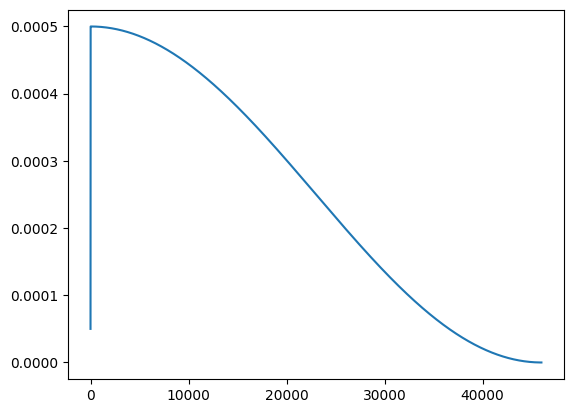

In [7]:
from transformers import get_cosine_schedule_with_warmup

n_epochs = 100

optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4)
criterion = nn.CrossEntropyLoss(
    weight=torch.tensor([0.5, 32, 32, 32, 32, 32, 32]).to("cuda")
)
scheduler = get_cosine_schedule_with_warmup(
    optimizer,
    num_warmup_steps=n_epochs // 10,
    num_training_steps=n_epochs * len(train_loader) * normalized_tomogram.shape[0],
)
seg_loss = SegmentationLoss(criterion)
padf = PadToSize(CFG.resolution)

# schedulerのlr推移の可視化
lr_list = []

for epoch in range(n_epochs * len(train_loader) * normalized_tomogram.shape[0]):
    scheduler.step()
    lr_list.append(optimizer.param_groups[0]["lr"])

plt.plot(lr_list)

del scheduler, lr_list, optimizer

optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4)

scheduler = get_cosine_schedule_with_warmup(
    optimizer,
    num_warmup_steps=n_epochs // 10,
    num_training_steps=n_epochs * len(train_loader) * normalized_tomogram.shape[0],
)

Train-Epoch: 0, Loss: 0.7292741516362066: 100%|██████████| 460/460 [00:20<00:00, 22.31it/s]
Train-nshuffle-Epoch: 0, Loss: 0.4618840191189362: 100%|██████████| 460/460 [00:08<00:00, 55.22it/s] 


EPOCH: 0, TRAIN_SCORE: 0.023308744154069798


Valid-Epoch: 0, Loss: 0.5366651798679453: 100%|██████████| 184/184 [00:03<00:00, 47.20it/s] 


EPOCH: 0, VALID_SCORE: 0.021944916206959507, VALID_SCORE_LIST: [0.024350892542119522, 0.01953893987179949]


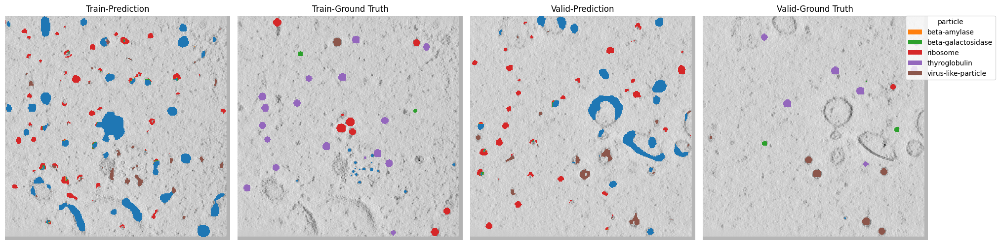

Train-Epoch: 1, Loss: 0.5614029258894532: 100%|██████████| 460/460 [00:19<00:00, 23.92it/s]
Train-nshuffle-Epoch: 1, Loss: 0.5105368287666984: 100%|██████████| 460/460 [00:07<00:00, 57.59it/s] 


EPOCH: 1, TRAIN_SCORE: 0.059014327831706424


Valid-Epoch: 1, Loss: 0.620908434867211: 100%|██████████| 184/184 [00:03<00:00, 46.40it/s] 


EPOCH: 1, VALID_SCORE: 0.0971988962807866, VALID_SCORE_LIST: [0.1414608512653976, 0.05293694129617561]


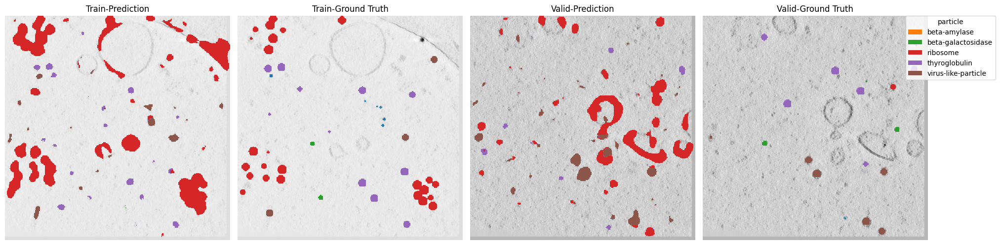

Train-Epoch: 2, Loss: 0.538058735365453: 100%|██████████| 460/460 [00:18<00:00, 24.41it/s]  
Train-nshuffle-Epoch: 2, Loss: 0.4503126610718344: 100%|██████████| 460/460 [00:08<00:00, 55.53it/s] 


EPOCH: 2, TRAIN_SCORE: 0.05937051649345019


Valid-Epoch: 2, Loss: 0.44753666266637004: 100%|██████████| 184/184 [00:03<00:00, 53.18it/s]


EPOCH: 2, VALID_SCORE: 0.05444546067477497, VALID_SCORE_LIST: [0.06540292069869129, 0.043488000650858664]


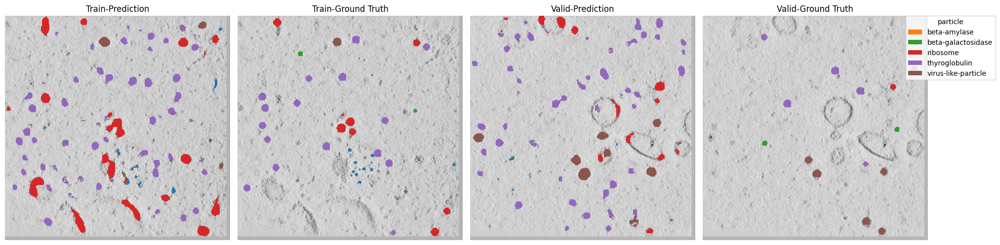

Train-Epoch: 3, Loss: 0.4452847283819447: 100%|██████████| 460/460 [00:18<00:00, 25.13it/s] 
Train-nshuffle-Epoch: 3, Loss: 0.2981420783568984: 100%|██████████| 460/460 [00:08<00:00, 55.59it/s] 


EPOCH: 3, TRAIN_SCORE: 0.047358844141106214


Valid-Epoch: 3, Loss: 0.36279171820648987: 100%|██████████| 184/184 [00:03<00:00, 55.65it/s]


EPOCH: 3, VALID_SCORE: 0.04791654684732548, VALID_SCORE_LIST: [0.054996914016427825, 0.040836179678223124]


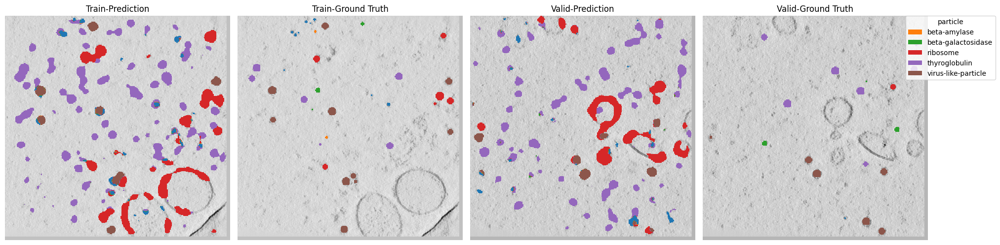

Train-Epoch: 4, Loss: 0.44598485743222027: 100%|██████████| 460/460 [00:18<00:00, 24.23it/s]
Train-nshuffle-Epoch: 4, Loss: 0.4465671167911395: 100%|██████████| 460/460 [00:07<00:00, 58.96it/s] 


EPOCH: 4, TRAIN_SCORE: 0.08716920855288074


Valid-Epoch: 4, Loss: 0.5570476391636159: 100%|██████████| 184/184 [00:03<00:00, 53.42it/s] 


EPOCH: 4, VALID_SCORE: 0.08797299784914883, VALID_SCORE_LIST: [0.09836001512151091, 0.07758598057678676]


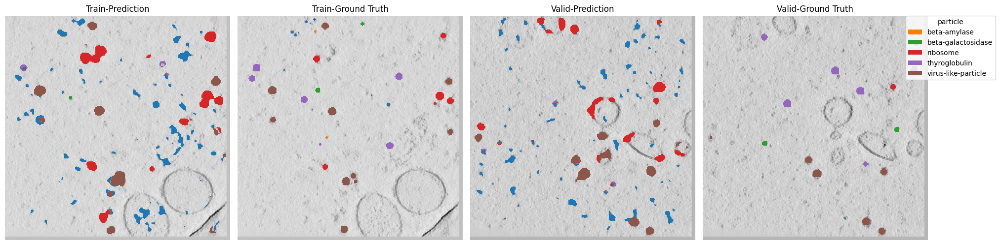

Train-Epoch: 5, Loss: 0.43076966615474743: 100%|██████████| 460/460 [00:18<00:00, 24.60it/s]
Train-nshuffle-Epoch: 5, Loss: 0.39540082959701184: 100%|██████████| 460/460 [00:07<00:00, 59.35it/s]


EPOCH: 5, TRAIN_SCORE: 0.060463023264227186


Valid-Epoch: 5, Loss: 0.50413334308921: 100%|██████████| 184/184 [00:03<00:00, 51.75it/s]   


EPOCH: 5, VALID_SCORE: 0.08687684744389558, VALID_SCORE_LIST: [0.09882838148643858, 0.07492531340135258]


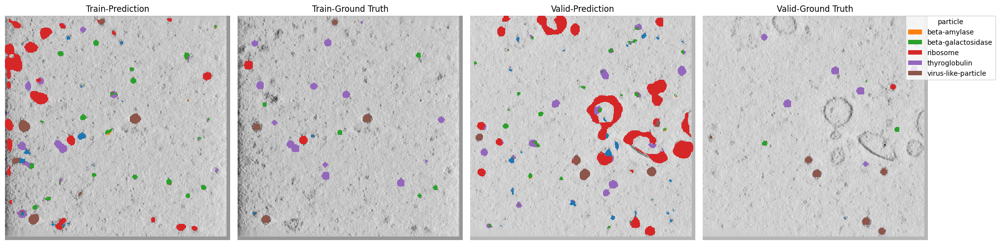

Train-Epoch: 6, Loss: 0.4277587196627713: 100%|██████████| 460/460 [00:18<00:00, 24.83it/s] 
Train-nshuffle-Epoch: 6, Loss: 0.2864470086991787: 100%|██████████| 460/460 [00:07<00:00, 59.66it/s] 


EPOCH: 6, TRAIN_SCORE: 0.060930393506575045


Valid-Epoch: 6, Loss: 0.3825273184186738: 100%|██████████| 184/184 [00:03<00:00, 52.77it/s] 


EPOCH: 6, VALID_SCORE: 0.07409928368760774, VALID_SCORE_LIST: [0.08685169877967816, 0.061346868595537306]


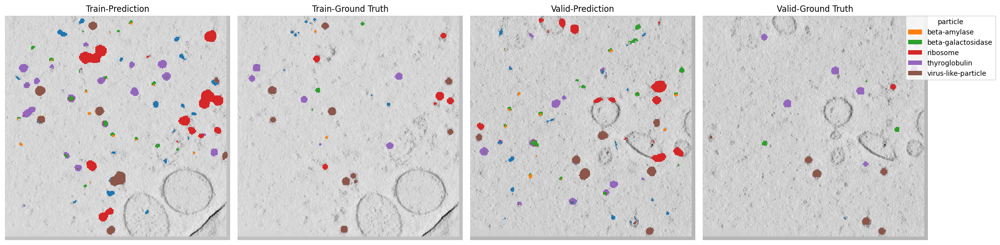

Train-Epoch: 7, Loss: 0.36721983329676416: 100%|██████████| 460/460 [00:18<00:00, 24.51it/s]
Train-nshuffle-Epoch: 7, Loss: 0.4429287095594665: 100%|██████████| 460/460 [00:08<00:00, 56.37it/s] 


EPOCH: 7, TRAIN_SCORE: 0.1496317568558781


Valid-Epoch: 7, Loss: 0.6305469923207293: 100%|██████████| 184/184 [00:03<00:00, 54.27it/s]


EPOCH: 7, VALID_SCORE: 0.1269394446222425, VALID_SCORE_LIST: [0.1473752702842071, 0.10650361896027787]


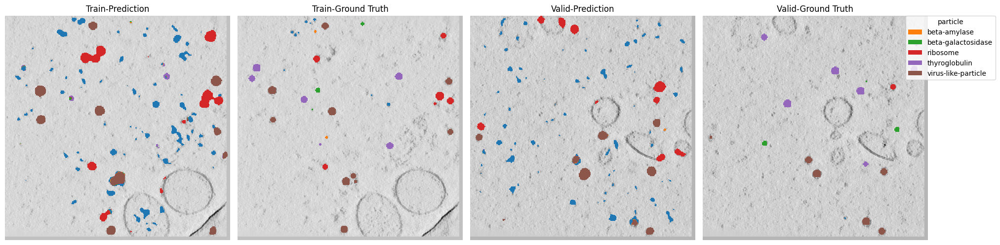

Train-Epoch: 8, Loss: 0.42065960687949605: 100%|██████████| 460/460 [00:19<00:00, 24.17it/s]
Train-nshuffle-Epoch: 8, Loss: 0.4187832556988882: 100%|██████████| 460/460 [00:08<00:00, 56.57it/s] 


EPOCH: 8, TRAIN_SCORE: 0.17888146733643645


Valid-Epoch: 8, Loss: 0.554963906781505: 100%|██████████| 184/184 [00:03<00:00, 54.50it/s]  


EPOCH: 8, VALID_SCORE: 0.17262822221078253, VALID_SCORE_LIST: [0.17733467423278107, 0.167921770188784]


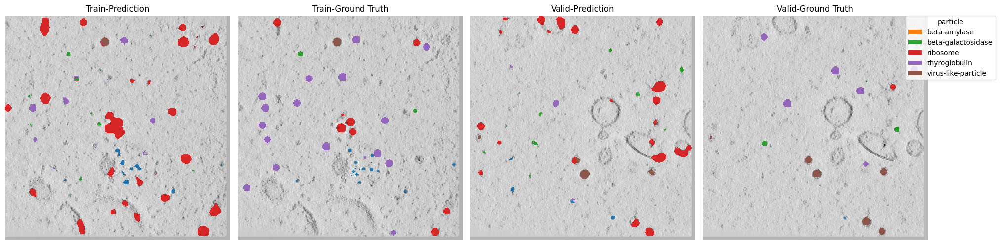

Train-Epoch: 9, Loss: 0.44760614948995087: 100%|██████████| 460/460 [00:18<00:00, 24.39it/s]
Train-nshuffle-Epoch: 9, Loss: 0.4333151931024116: 100%|██████████| 460/460 [00:08<00:00, 57.47it/s] 


EPOCH: 9, TRAIN_SCORE: 0.15588460441529817


Valid-Epoch: 9, Loss: 0.56790283565288: 100%|██████████| 184/184 [00:03<00:00, 53.61it/s]   


EPOCH: 9, VALID_SCORE: 0.16779929029518575, VALID_SCORE_LIST: [0.18177624259024197, 0.1538223380001295]


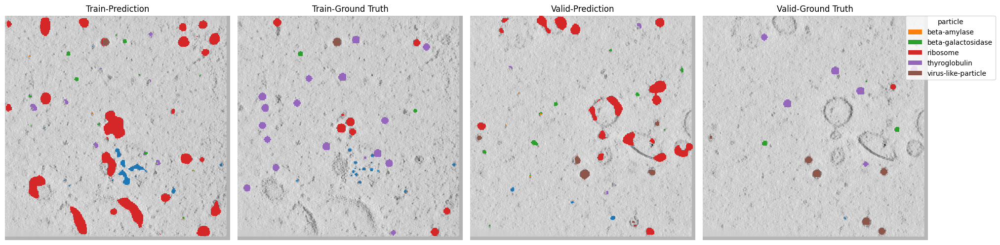

Train-Epoch: 10, Loss: 0.3814835002524373: 100%|██████████| 460/460 [00:18<00:00, 24.27it/s] 
Train-nshuffle-Epoch: 10, Loss: 0.5247147331014276: 100%|██████████| 460/460 [00:07<00:00, 58.20it/s] 


EPOCH: 10, TRAIN_SCORE: 0.13795615849089282


Valid-Epoch: 10, Loss: 0.6109378536069847: 100%|██████████| 184/184 [00:03<00:00, 48.75it/s]


EPOCH: 10, VALID_SCORE: 0.18873896105411547, VALID_SCORE_LIST: [0.22619897387974103, 0.1512789482284899]


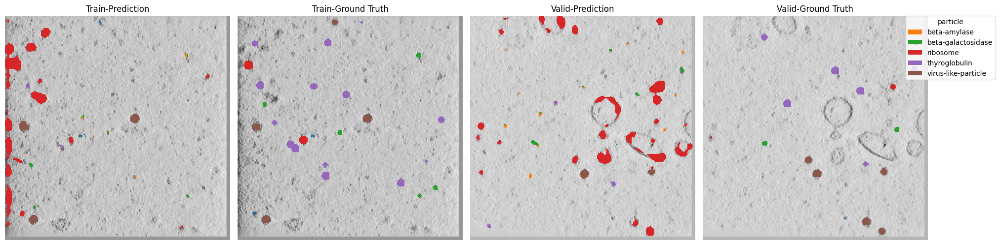

Train-Epoch: 11, Loss: 0.3980160928209839: 100%|██████████| 460/460 [00:21<00:00, 20.93it/s] 
Train-nshuffle-Epoch: 11, Loss: 0.3925775001311432: 100%|██████████| 460/460 [00:08<00:00, 54.04it/s] 


EPOCH: 11, TRAIN_SCORE: 0.18616827624632032


Valid-Epoch: 11, Loss: 0.5571666757940598: 100%|██████████| 184/184 [00:03<00:00, 54.20it/s] 


EPOCH: 11, VALID_SCORE: 0.17875419641964052, VALID_SCORE_LIST: [0.19359211206699437, 0.16391628077228668]


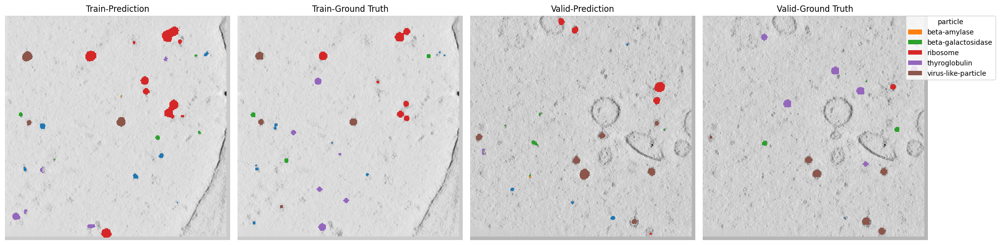

Train-Epoch: 12, Loss: 0.3739054155090581: 100%|██████████| 460/460 [00:18<00:00, 24.44it/s] 
Train-nshuffle-Epoch: 12, Loss: 0.24131924659013748: 100%|██████████| 460/460 [00:07<00:00, 58.01it/s]


EPOCH: 12, TRAIN_SCORE: 0.11188240910842621


Valid-Epoch: 12, Loss: 0.5216840551761182: 100%|██████████| 184/184 [00:03<00:00, 49.44it/s] 


EPOCH: 12, VALID_SCORE: 0.1342464292478209, VALID_SCORE_LIST: [0.1492029740782377, 0.11928988441740411]


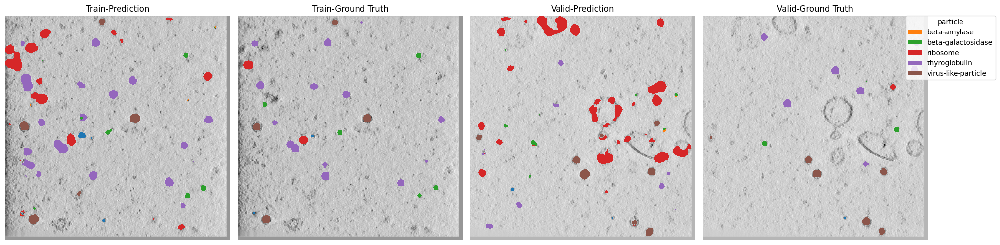

Train-Epoch: 13, Loss: 0.3888336233592228: 100%|██████████| 460/460 [00:21<00:00, 21.50it/s] 
Train-nshuffle-Epoch: 13, Loss: 0.35411856702488403: 100%|██████████| 460/460 [00:07<00:00, 58.62it/s]


EPOCH: 13, TRAIN_SCORE: 0.1933344656206229


Valid-Epoch: 13, Loss: 0.5554963475417184: 100%|██████████| 184/184 [00:03<00:00, 47.67it/s] 


EPOCH: 13, VALID_SCORE: 0.19115671952167335, VALID_SCORE_LIST: [0.2227285338163676, 0.15958490522697907]


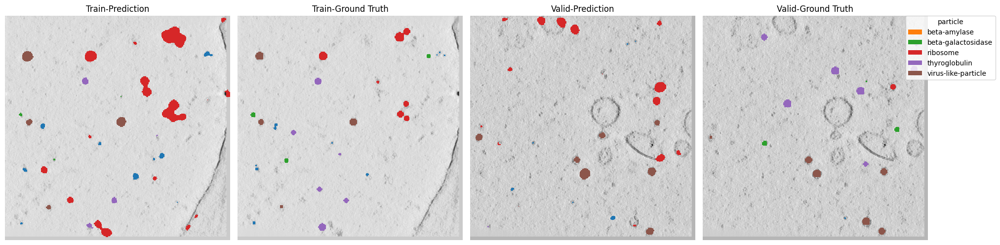

Train-Epoch: 14, Loss: 0.36521408821496626: 100%|██████████| 460/460 [00:19<00:00, 23.59it/s]
Train-nshuffle-Epoch: 14, Loss: 0.5011540000529393: 100%|██████████| 460/460 [00:08<00:00, 56.53it/s] 


EPOCH: 14, TRAIN_SCORE: 0.25308277400117996


Valid-Epoch: 14, Loss: 0.7391951645764968: 100%|██████████| 184/184 [00:03<00:00, 54.34it/s]


EPOCH: 14, VALID_SCORE: 0.18528601108831078, VALID_SCORE_LIST: [0.19988917487298058, 0.17068284730364094]


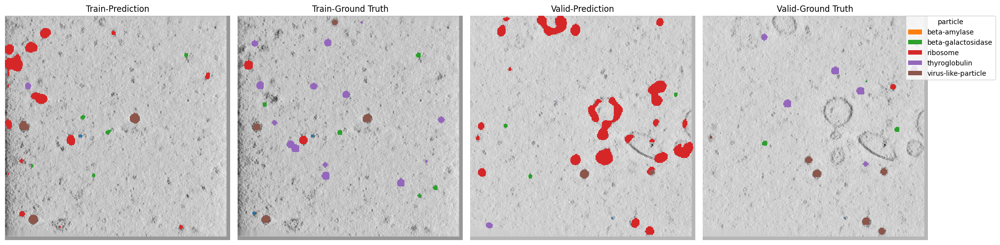

Train-Epoch: 15, Loss: 0.3631730369251707: 100%|██████████| 460/460 [00:18<00:00, 24.49it/s] 
Train-nshuffle-Epoch: 15, Loss: 0.6922584122775689: 100%|██████████| 460/460 [00:08<00:00, 56.31it/s]


EPOCH: 15, TRAIN_SCORE: 0.37717550941464284


Valid-Epoch: 15, Loss: 0.770783504916598: 100%|██████████| 184/184 [00:03<00:00, 53.56it/s] 


EPOCH: 15, VALID_SCORE: 0.26997392693013644, VALID_SCORE_LIST: [0.27120239813714775, 0.2687454557231251]


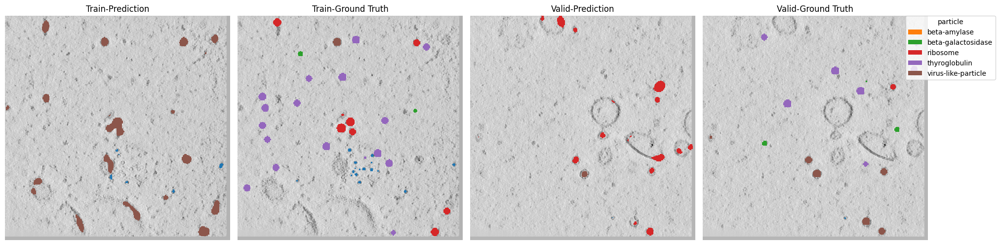

Train-Epoch: 16, Loss: 0.4039226879082296: 100%|██████████| 460/460 [00:19<00:00, 23.33it/s] 
Train-nshuffle-Epoch: 16, Loss: 0.5195375399097152: 100%|██████████| 460/460 [00:08<00:00, 55.89it/s] 


EPOCH: 16, TRAIN_SCORE: 0.3594777510571973


Valid-Epoch: 16, Loss: 0.7528110483823263: 100%|██████████| 184/184 [00:03<00:00, 50.50it/s]


EPOCH: 16, VALID_SCORE: 0.2504124389063284, VALID_SCORE_LIST: [0.27633186066363036, 0.22449301714902647]


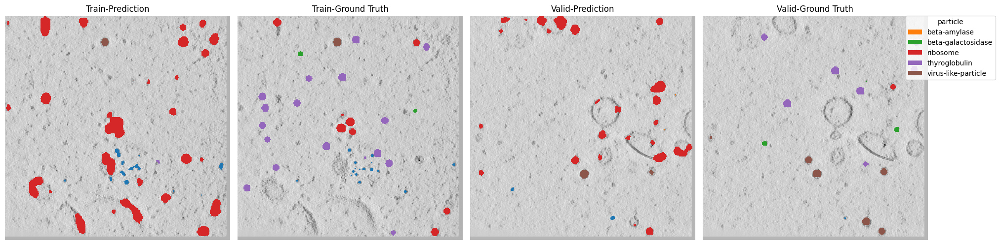

Train-Epoch: 17, Loss: 0.36561642230245406: 100%|██████████| 460/460 [00:19<00:00, 24.21it/s]
Train-nshuffle-Epoch: 17, Loss: 0.39238352134175924: 100%|██████████| 460/460 [00:07<00:00, 59.14it/s]


EPOCH: 17, TRAIN_SCORE: 0.23643298639166374


Valid-Epoch: 17, Loss: 0.5455672746200276: 100%|██████████| 184/184 [00:03<00:00, 49.52it/s] 


EPOCH: 17, VALID_SCORE: 0.2134703622336448, VALID_SCORE_LIST: [0.24345136776303786, 0.18348935670425176]


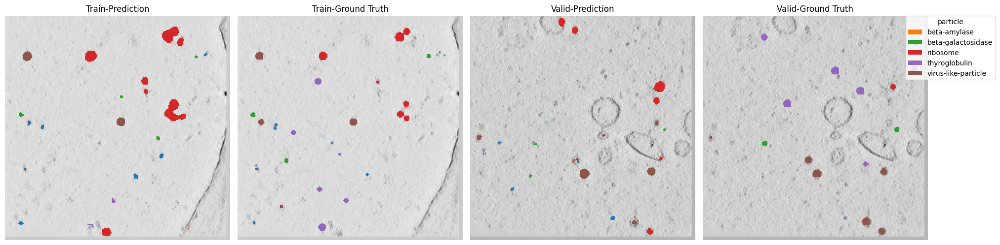

Train-Epoch: 18, Loss: 0.40142770474776623: 100%|██████████| 460/460 [00:19<00:00, 23.76it/s]
Train-nshuffle-Epoch: 18, Loss: 0.5730238500496615: 100%|██████████| 460/460 [00:08<00:00, 54.78it/s]


EPOCH: 18, TRAIN_SCORE: 0.2532391413138172


Valid-Epoch: 18, Loss: 0.6797130037018139: 100%|██████████| 184/184 [00:03<00:00, 54.46it/s]


EPOCH: 18, VALID_SCORE: 0.16428451633313546, VALID_SCORE_LIST: [0.1718273133923749, 0.15674171927389605]


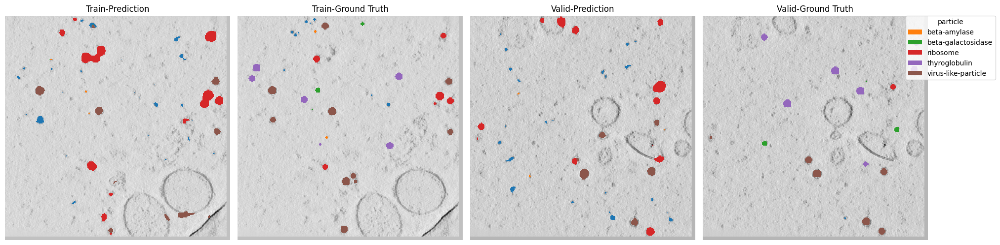

Train-Epoch: 19, Loss: 0.38020821580379877: 100%|██████████| 460/460 [00:18<00:00, 24.24it/s]
Train-nshuffle-Epoch: 19, Loss: 0.562013837715581:  95%|█████████▍| 436/460 [00:07<00:00, 66.17it/s] 

In [ ]:
best_model = None
best_score = 0
batch_size = 4

for epoch in range(100):
    train_loss = []
    train_nshuffle_loss = []
    valid_loss = []

    train_original_tomogram = defaultdict(list)
    train_pred_tomogram = defaultdict(list)
    train_gt_tomogram = defaultdict(list)

    train_nshuffle_original_tomogram = defaultdict(list)
    train_nshuffle_pred_tomogram = defaultdict(list)
    train_nshuffle_gt_tomogram = defaultdict(list)

    valid_original_tomogram = defaultdict(list)
    valid_pred_tomogram = defaultdict(list)
    valid_gt_tomogram = defaultdict(list)

    model.train()
    tq = tqdm(range(len(train_loader) * normalized_tomogram.shape[0]))
    for data in train_loader:
        exp_name = data["exp_name"][0]
        tomogram = data["normalized_tomogram"].to("cuda")
        segmentation_map = data["segmentation_map"].to("cuda").long()

        train_original_tomogram[exp_name] = (
            padf(tomogram).squeeze().cpu().detach().numpy()
        )

        random_index = torch.randperm(tomogram.shape[1])

        for i in random_index:
            optimizer.zero_grad()
            input_ = tomogram[:, i].unsqueeze(0)
            gt = segmentation_map[:, i]

            input_ = padf(input_)
            gt = padf(gt)
            input_, gt = aug(input_, gt)
            output = model(input_)
            loss = seg_loss(output, gt)
            loss.backward()
            optimizer.step()
            scheduler.step()

            train_loss.append(loss.item())
            tq.set_description(f"Train-Epoch: {epoch}, Loss: {np.mean(train_loss)}")
            tq.update(1)

            # print(output.shape, gt.shape) # torch.Size([1, 7, 160, 160]) torch.Size([1, 160, 160])
            train_pred_tomogram[exp_name].append(output.cpu().detach().numpy())
            train_gt_tomogram[exp_name].append(gt.cpu().detach().numpy())
    tq.close()
    train_exp_name = exp_name

    ######################################## train-nshuffle #########################################
    model.eval()
    tq = tqdm(range(len(train_nshuffle_loader) * normalized_tomogram.shape[0]))
    for data in train_nshuffle_loader:
        exp_name = data["exp_name"][0]
        tomogram = data["normalized_tomogram"].to("cuda")
        segmentation_map = data["segmentation_map"].to("cuda").long()

        train_nshuffle_original_tomogram[exp_name] = (
            padf(tomogram).squeeze().cpu().detach().numpy()
        )

        for i in range(tomogram.shape[1]):
            input_ = tomogram[:, i].unsqueeze(0)
            gt = segmentation_map[:, i]

            input_ = padf(input_)
            gt = padf(gt)
            output = model(input_)
            loss = seg_loss(output, gt)

            train_nshuffle_loss.append(loss.item())
            tq.set_description(
                f"Train-nshuffle-Epoch: {epoch}, Loss: {np.mean(train_nshuffle_loss)}"
            )
            tq.update(1)

            # print(output.shape, gt.shape) # torch.Size([1, 7, 160, 160]) torch.Size([1, 160, 160])
            train_nshuffle_pred_tomogram[exp_name].append(output.cpu().detach().numpy())
            train_nshuffle_gt_tomogram[exp_name].append(gt.cpu().detach().numpy())
    tq.close()

    train_score_, _ = visualize_epoch_results(
        train_nshuffle_pred_tomogram,
        base_dir="../../inputs/train/overlay/ExperimentRuns/",
        sikii_dict=CFG.initial_sikii,
    )
    print(f"EPOCH: {epoch}, TRAIN_SCORE: {train_score_}")

    ############################################# valid #############################################

    model.eval()
    tq = tqdm(range(len(valid_loader) * normalized_tomogram.shape[0]))
    for data in valid_loader:
        exp_name = data["exp_name"][0]
        tomogram = data["normalized_tomogram"].to("cuda")
        segmentation_map = data["segmentation_map"].to("cuda").long()

        valid_original_tomogram[exp_name] = (
            padf(tomogram).squeeze().cpu().detach().numpy()
        )

        for i in range(tomogram.shape[1]):
            input_ = tomogram[:, i].unsqueeze(0)
            gt = segmentation_map[:, i]

            input_ = padf(input_)
            gt = padf(gt)
            output = model(input_)
            loss = seg_loss(output, gt)

            valid_loss.append(loss.item())
            tq.set_description(f"Valid-Epoch: {epoch}, Loss: {np.mean(valid_loss)}")
            tq.update(1)

            # print(output.shape, gt.shape) # torch.Size([1, 7, 160, 160]) torch.Size([1, 160, 160])
            valid_pred_tomogram[exp_name].append(output.cpu().detach().numpy())
            valid_gt_tomogram[exp_name].append(gt.cpu().detach().numpy())
    tq.close()
    valid_exp_name = exp_name

    valid_score_, valid_score_list = visualize_epoch_results(
        valid_pred_tomogram,
        base_dir="../../inputs/train/overlay/ExperimentRuns/",
        sikii_dict=CFG.initial_sikii,
    )

    print(
        f"EPOCH: {epoch}, VALID_SCORE: {valid_score_}, VALID_SCORE_LIST: {valid_score_list}"
    )
    if valid_score_ > best_score:
        best_score = valid_score_
        best_model = model
        torch.save(model.state_dict(), f"best_model.pth")

    # 描画
    index = 30
    plt.figure(figsize=(20, 5))

    # Train-Pred-Plot
    ax = plt.subplot(1, 4, 1)
    pred = train_nshuffle_pred_tomogram[train_exp_name][index][0].argmax(0)
    plot_with_colormap(
        pred,
        "Train-Prediction",
        train_nshuffle_original_tomogram[train_exp_name][index],
    )

    # Train-GT-Plot
    ax = plt.subplot(1, 4, 2)
    gt = train_nshuffle_gt_tomogram[train_exp_name][index][0]
    plot_with_colormap(
        gt,
        "Train-Ground Truth",
        train_nshuffle_original_tomogram[train_exp_name][index],
    )

    # Valid-Pred-Plot
    ax = plt.subplot(1, 4, 3)
    pred = valid_pred_tomogram[valid_exp_name][index][0].argmax(0)
    plot_with_colormap(
        pred, "Valid-Prediction", valid_original_tomogram[valid_exp_name][index]
    )

    # Valid-GT-Plot
    ax = plt.subplot(1, 4, 4)
    gt = valid_gt_tomogram[valid_exp_name][index][0]
    plot_with_colormap(
        gt, "Valid-Ground Truth", valid_original_tomogram[valid_exp_name][index]
    )

    # 凡例を追加
    legend_elements = [
        Patch(facecolor=colors[i], label=CFG.particles_name[i])
        for i in range(1, num_classes)
    ]
    plt.legend(
        handles=legend_elements,
        loc="upper right",
        title="particle",
        bbox_to_anchor=(1.3, 1),  # 凡例を右上に配置
        borderaxespad=0,
    )

    plt.tight_layout()
    plt.show()

# save_images(
#     train_gt_tomogram=train_gt_tomogram,
#     train_pred_tomogram=train_pred_tomogram,
#     valid_gt_tomogram=valid_gt_tomogram,
#     valid_pred_tomogram=valid_pred_tomogram,
#     save_dir="images",
#     epoch=epoch,
# )